https://chatgpt.com/c/6923dd0d-73bc-8333-bd1f-6f925e7da38d

In [1]:
!curl "https://www.bu.edu/cds-faculty/files/2024/11/CCDS-Raised-View-From-Afar.jpg" > cds.jpg

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  286k  100  286k    0     0   648k      0 --:--:-- --:--:-- --:--:--  649k


In [2]:
import os
import sys

In [3]:
# automatically add location of class packages if running on the SCC

scc_site_packages = "/projectnb/ds542/materials/lib/python3.12/site-packages"
if os.path.isdir(scc_site_packages) and scc_site_packages not in sys.path:
    sys.path.append(scc_site_packages)


In [4]:
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel
import torch
from PIL import Image

import cv2
import numpy as np

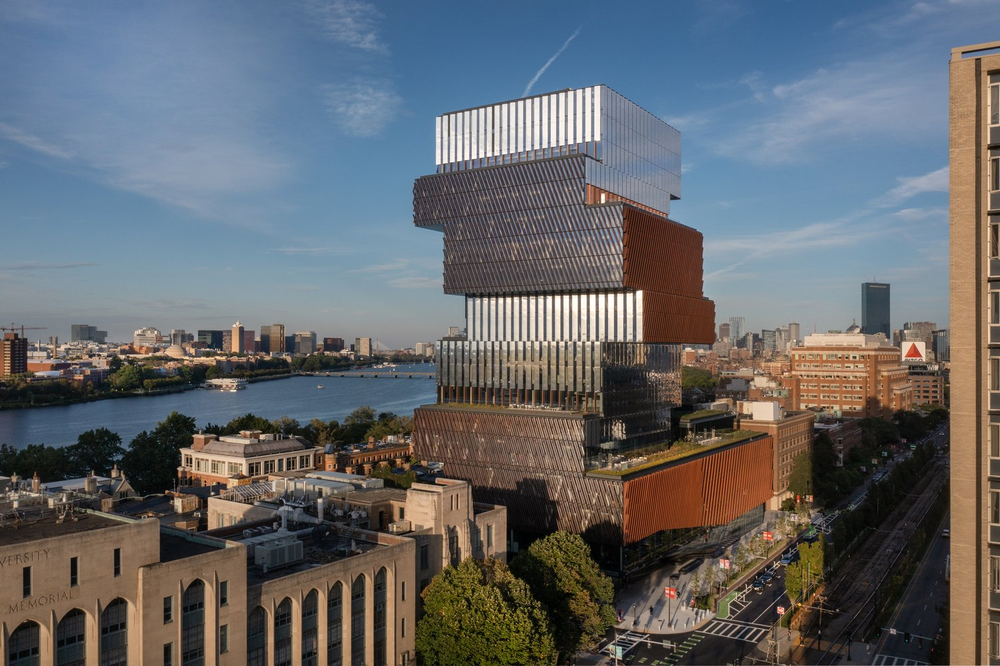

In [5]:
original_image = Image.open("cds.jpg")
original_image

In [6]:
img = cv2.imread("cds.jpg")
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
edges = cv2.Canny(gray, 100, 200)   # thresholds: low=100, high=200
edges = cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB)
cv2.imwrite("cds-edges.png", edges)

True

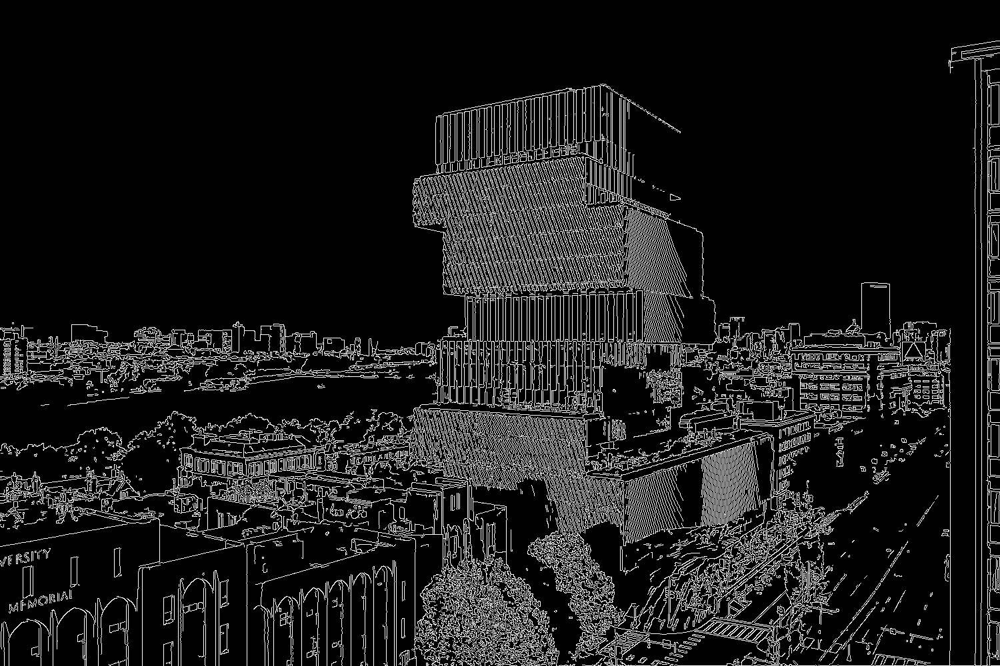

In [7]:
edges_image = Image.open("cds-edges.png")
edges_image

In [8]:
control = ControlNetModel.from_pretrained("lllyasviel/sd-controlnet-canny")
pipe = StableDiffusionControlNetPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5",
    controlnet=control,
    # torch_dtype=torch.float16
).to("cuda")


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [9]:
edges_tensor = torch.tensor(np.asarray(edges_image).astype(float) / 255.0).permute((2, 0, 1)).unsqueeze(0)
edges_tensor.shape, edges_tensor.dtype

(torch.Size([1, 3, 1000, 1500]), torch.float64)

  0%|          | 0/50 [00:00<?, ?it/s]

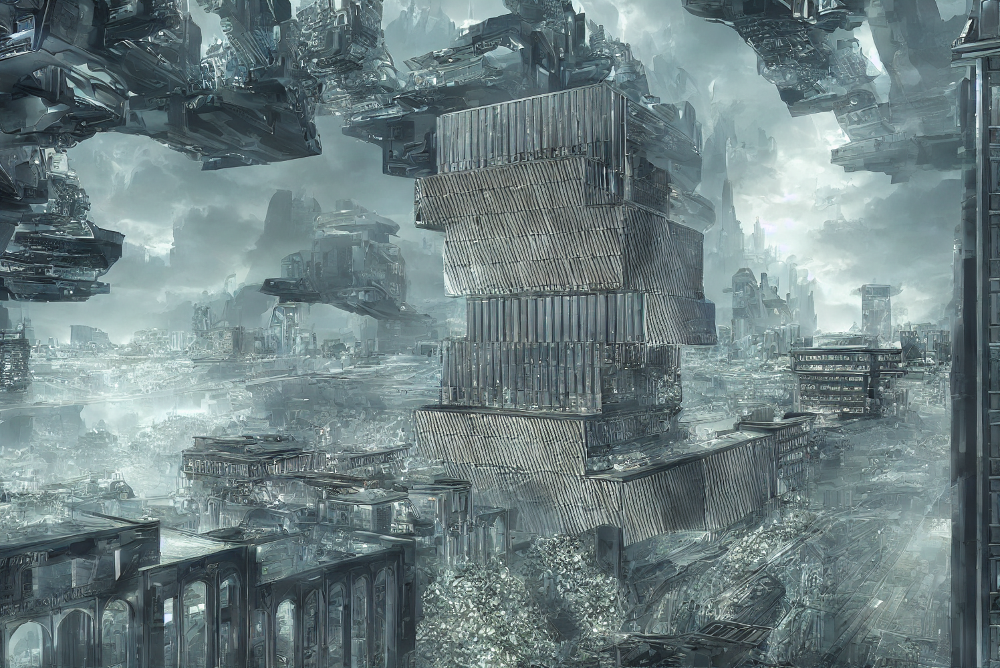

In [10]:
# input_image = Image.open("edge.png")
result = pipe("a futuristic city", image=edges_tensor).images[0]
result.save("cds-futuristic-out.png")
result


  0%|          | 0/50 [00:00<?, ?it/s]

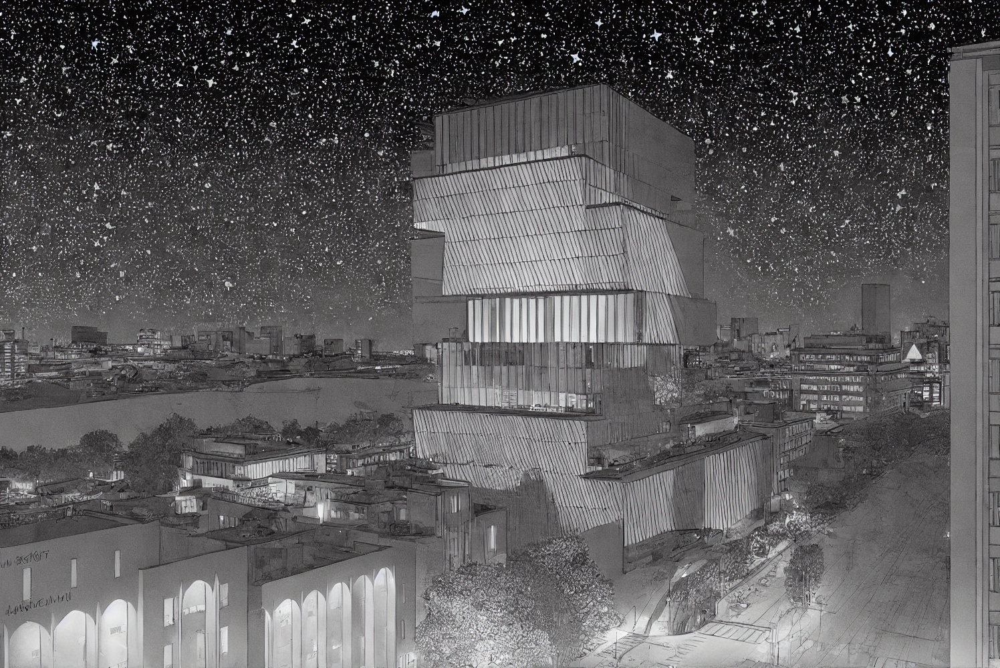

In [11]:
result = pipe("line drawing, quiet night, stars", image=edges_tensor).images[0]
result

  0%|          | 0/50 [00:00<?, ?it/s]

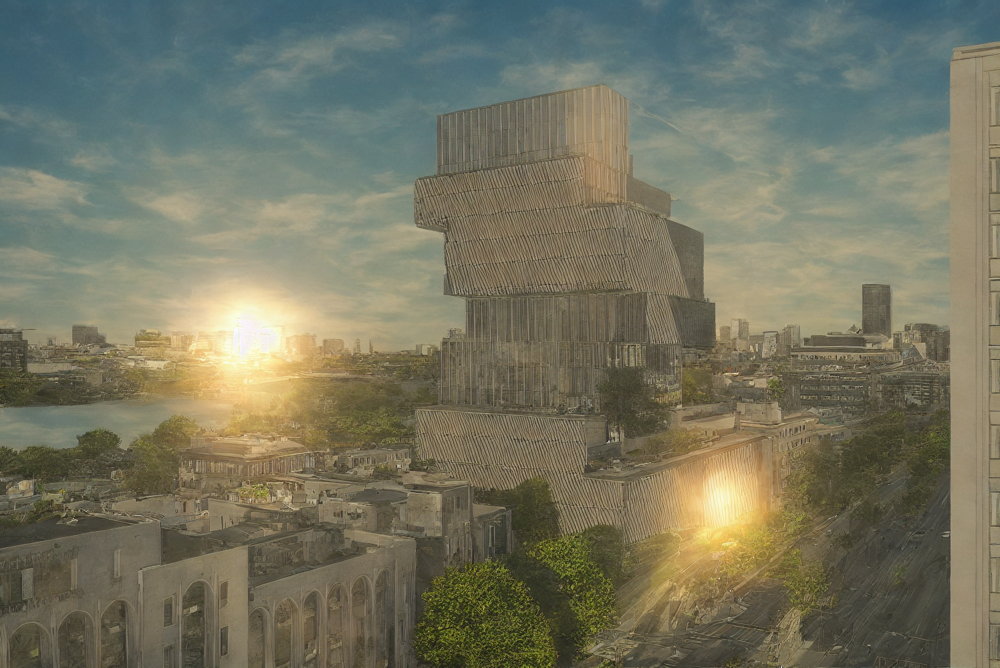

In [12]:
result = pipe("sunny day, photo realistic, high def", image=edges_tensor).images[0]
result